## Global MTM

Analysis of global MTM solution and comparison to trials kinematics data

In [1]:
cd("/Users/federicoclaudi/Documents/Github/LocomotionControl/analysis/behavior")
import Pkg; 
Pkg.activate(".")

using Plots, CSV, Term
import Term: install_term_logger
import MyterialColors: salmon, green_dark, blue_grey_darker
using Statistics
import DataFrames: DataFrame
using MultiKDE
using StatsBase
import Base.Iterators: product as ×
using DataFrames: DataFrame

using jcontrol
using jcontrol.visuals
import jcontrol.visuals: arena
import jcontrol.comparisons: ComparisonPoints
import jcontrol.io: PATHS

install_term_logger();

  Activating project at `~/Documents/Github/LocomotionControl/analysis/behavior`


@Debug (GR.__init__):  GR Binaries: 
  │ 
  │ (String)  ▶  GR.gr_provider = BinaryBuilder 
  │ (String)  ▶  GR.libGR       = libGR.dylib 
  │ (String)  ▶  GR.libGR3      = libGR3.dylib 
  │ (String)  ▶  GR.libGRM      = libGRM.dylib 
  ╰──────────────────────────────────────────────── 


                      Mon, 25 Apr 2022 13:49:07 


@Debug (PNGFiles.#load#2):  Load PNG File: 
  │ 


  │ (String)        ▶  fpath   = src/arena.png 
  │ (Ptr{Nothing})  ▶  png_ptr = Ptr{Nothing} @0x00007fc0ccd92800 
  ╰──────────────────────────────────────────────── 
                      Mon, 25 Apr 2022 13:49:46 


@Debug (PNGFiles.#_load#6):  Read PNG info: 
  │ 
  │ (String)        ▶  PNG_HEADER_VERSION_STRING =  libpng version 1.6.37 - April 14, 2019 
  │                                                 
  │ (Ptr{Nothing})  ▶  png_ptr                   = Ptr{Nothing} @0x00007fc0ccd92800 
  │ (UInt32)        ▶  height                    = 3508 
  │ (UInt32)        ▶  width                     = 2481 


  │ (UInt8)         ▶  color_type_orig           = 2 
  │ (UInt8)         ▶  color_type                = 2 
  │ (UInt8)         ▶  bit_depth_orig            = 8 
  │ (UInt8)         ▶  bit_depth                 = 8 
  │ (UInt8)         ▶  num_channels              = 3 
  │ (UInt8)         ▶  interlace_type            = 0 
  │ (Nothing)       ▶  gamma                     = nothing 
  │ (Float64)       ▶  image_gamma               = -1.0 
  │ (Int64)         ▶  screen_gamma              = -1 
  │ (Bool)          ▶  background                = false 
  │ (Int32)         ▶  intent                    = -1 
  │ (Bool)          ▶  read_as_paletted          = false 
  │ (Int32)         ▶  n_passes                  = 1 
  │ (DataType)      ▶  buffer_eltype             = ColorTypes.RGB{FixedPointNumbers.N0f8} 
  │ (Bool)          ▶  valid_sRGB                = false 
  │ (Bool)          ▶  valid_gAMA                = false 
  │ (Bool)          ▶  valid_tRNS                = false 
  │ (Bool)    

## Figure 5

Show that the global MTM solution is a good representation of the animals traces.

In [2]:
# load trials
trials = load_cached_trials(; keep_n = nothing);
@info "Loaded $(length(trials)) trials"

S = getfield.(trials, :s)
speed = map(t -> sqrt.(t.u .^ 2 .+ t.v .^ 2), trials)
U = getfield.(trials, :u)
Ω = getfield.(trials, :ω);

# load comparison points
cpoints = ComparisonPoints(FULLTRACK; δs=1, trials=trials, s₀=1.0, s₁=250.0);


@Info (Main):  Loaded 310 trials 
  ╰──────────────────────────────────────────────── 


                      Mon, 25 Apr 2022 13:50:20 


In [3]:
# create trials speed and angular velocity heatmaps
speed = zeros(250, 100)
ω = zeros(250, 30)

for (n, cp) in enumerate(cpoints.points[3:end-1])
    sp = fit(Histogram, cp.kinematics.u.values, 1:101)
    speed[n, :] .= sp.weights


    angvel = fit(Histogram, cp.kinematics.ω.values, -15:15)
    ω[n, :] .= angvel.weights
end


In [4]:
# load MTM global solution
globalsolution = DataFrame(CSV.File(joinpath(PATHS["horizons_sims_cache"], "global_solution.csv")))
globalsolution = Solution(globalsolution);
gs_speed = sqrt.(globalsolution.u .^ 2 .+ globalsolution.v .^ 2)


479-element Vector{Float64}:
 10.0
 12.788618332974545
 15.577240551956715
 18.36586488682459
 18.36586488682459
 21.1544905008182
 22.96267286872748
 24.770855783491008
 26.579039133500622
 29.825645722612734
  ⋮
 43.900478542550275
 42.246502026016444
 40.39107958191451
 39.46758352949179
 37.52697859396943
 35.48714764778167
 34.46753751303532
 32.2337687565176
 31.116884378258785

### make plot

@Debug (GR.load_libs):  Library handles 
  │ 
  │ (Ptr{Nothing})  ▶  libGR_handle  = Ptr{Nothing} @0x00007f8dfdc99fb0 
  │ (Ptr{Nothing})  ▶  libGR3_handle = Ptr{Nothing} @0x00007f8dfd7f94a0 
  │ (Ptr{Nothing})  ▶  libGRM_handle = Ptr{Nothing} @0x00007f8dfdcb99e0 
  ╰──────────────────────────────────────────────── 
                      Mon, 25 Apr 2022 13:52:21 
@Debug (GR.init):  Found an embedded environment

 
  │ 
  │ (String)  ▶  mime_type           = svg 
  │ (String)  ▶  file_path           = /var/folders/rl/_jtq_pds03vby1fvxsvrvv9c0000gn/T/jl_UGDZHt.svg 
  │ (String)  ▶  ENV["GKSwstype"]    = svg 
  │ (String)  ▶  ENV["GKS_FILEPATH"] = /var/folders/rl/_jtq_pds03vby1fvxsvrvv9c0000gn/T/jl_UGDZHt.svg 
  ╰──────────────────────────────────────────────── 
                      Mon, 25 Apr 2022 13:52:21 
@Debug (GR.init):  Found GKS_ENCODING in ENV

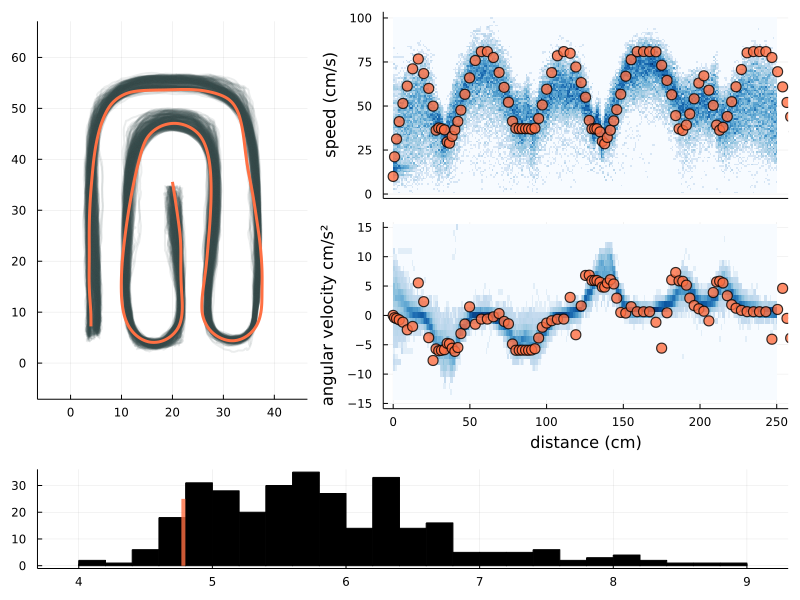

 
  │ 
  │ (Int64)  ▶  text_encoding = 301 
  ╰──────────────────────────────────────────────── 
                      Mon, 25 Apr 2022 13:52:21 


In [5]:
layout = @layout [
    a{0.4w} grid(2, 1)
    c{.2h}
]

fig = plot(; layout=layout, size=(800, 600))


plot!.(
    getfield.(trials, :x), 
    getfield.(trials, :y), 
    color=blue_grey_darker, 
    lw=2, alpha=.1, subplot=1,
    label=nothing,
)
plot!(; subplot=1, aspect_ratio=:equal, xlim=[-5, 45], ylim=[-5, 65],)

plot!(
    globalsolution.x, globalsolution.y,
    lw=3, color=salmon, label=nothing, subplot=1
)

# plot trials kinematics heatmap
heatmap!(speed', 
    color=cgrad(:Blues_9, [.05, .25, .5, 1.0]),
    subplot=2,
    colorbar=false,
)
heatmap!(
    1:size(ω,1),
    (1-15):(size(ω,2)-15),
    ω', 
    colorbar=false,
    color=cgrad(:Blues_9, [.01, .25, .5, 1.0]),
    subplot=3
)

# plot solution kinematics
scatter!(globalsolution.s[1:5:end], gs_speed[1:5:end], 
            ms=6, alpha=.8, color=salmon, label=nothing, subplot=2)
scatter!(globalsolution.s[1:5:end], globalsolution.ω[1:5:end], 
            ms=6, alpha=.8, color=salmon, label=nothing, subplot=3)

# plot trials durations histogram
histogram!(
    getfield.(trials, :duration), 
    bins=30, 
    color="black", 
    subplot=4,
    colorbar=false, label=nothing,
)

plot!(
    [globalsolution.t[end], globalsolution.t[end]], [0, 25], subplot=4,
    lw=4, color=salmon, alpha=.8, label=nothing
)


# set plot properties
plot!(; subplot=2, xlim=[1, 250], xticks=[], ylabel="speed (cm/s)")
plot!(; subplot=3, ylim=[-15, 15], xlim=[1, 250], xlabel="distance (cm)", ylabel="angular velocity cm/s²")
display(fig)

#### Kinematics analysis

Compare model's kinematics to distributions from the trials, make sure movement properties are realistic

In [6]:
function kdeplot!(X; scaling=1.0, shift=0.0, v0=0, v1=1.0, bw=1.0, xshift=0.0,  color="red", nbins=nothing, horizontal=false, normalize=false, fillalpha=.3,  kwargs...)
    kde = KDEUniv(ContinuousDim(), bw, X, MultiKDE.gaussian)

    nbins = isnothing(nbins) ? (Int64 ∘ round)(v1-v0) * 2 : 100
    x = Vector(LinRange(v0, v1, nbins))
    
    density = [MultiKDE.pdf(kde, _x, keep_all=false) for _x in x]
    density = normalize ? density ./ maximum(density) : density
    y = density .* scaling .+ shift
    
    if horizontal
        x, y = y, x
    end

    plot!(
        x .- xshift,
        y;  
        colorbar=false,
        color = color,
        lw=2,
        fillcolor=color, fillalpha=fillalpha, fillrange=zeros(length(density)) .+ shift .+  minimum(density),
        kwargs...
    )
end


kdeplot! (generic function with 1 method)

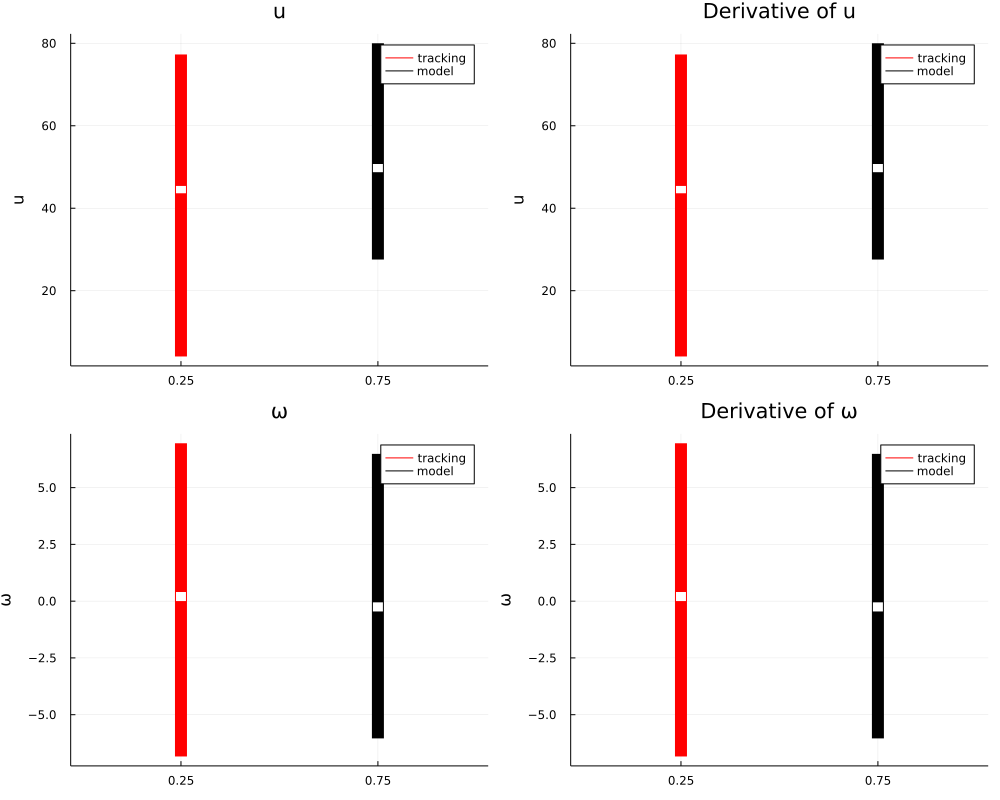

In [7]:


function plot_CI!(X, xpos, color; kwargs...)
    low, med, high = percentile(X, [2.5, 50, 97.5])

    plot!(
        [xpos, xpos], [low, high],
        color=color,
        lw=12;
        kwargs...
    )
    Δ = max(0.02 * med, .2)
    plot!(
        [xpos, xpos], [med - Δ, med + Δ],
        color="white",
        lw=10, label=nothing
    )
end

plots = []
for (var, (bw1, bw2)) in zip((:u, :ω), ((2, 30), (.5, 15)))
    # get flat variable and 95th CI
    varflat = vcat(getfield.(trials, var)...)
    modvar = getfield(globalsolution, var)


    # plot CIs
    plt = plot(title=var, xlim=[0, 1], ylabel=var, xticks=[.25, .75])
    plot_CI!(varflat, 0.25, "red"; label="tracking")
    plot_CI!(modvar, 0.75, "black"; label="model")
    push!(plots, plt)

    # get derivatives and plot those too
    varder = diff(varflat) .* 60
    modder = diff(modvar) * 1/0.005

    plt = plot(title="Derivative of $var", xlim=[0, 1], ylabel=var, xticks=[.25, .75])
    plot_CI!(varflat, 0.25, "red"; label="tracking")
    plot_CI!(modvar, 0.75, "black"; label="model")
    push!(plots, plt)


end

plot(plots..., size=(1000, 800))


### Deviation analysis
At each checkpoint get distance and angle delta between model and trials and compare to that among trials.

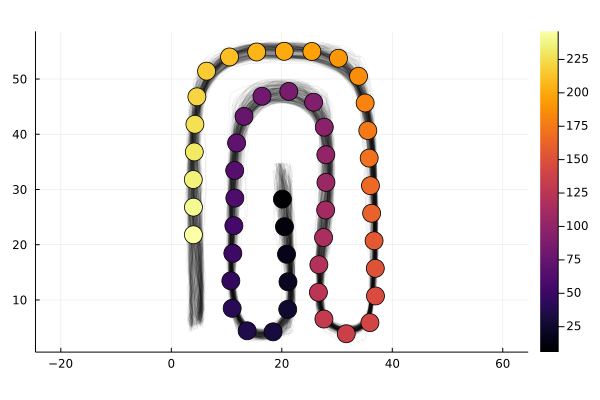

In [8]:
cpoints = ComparisonPoints(FULLTRACK; δs=5, trials=trials, s₀=1.0, s₁=250.0);
valid_points = cpoints.points[4:end-1]

plt = plot(; aspect_ratio=:equal)

for trial in trials
    plot!(trial.x, trial.y, color="black", label=nothing, alpha=.05)
end

scatter!(
    getfield.(valid_points,:x),
    getfield.(valid_points,:y),
    marker_z=getfield.(valid_points, :s),
    ms=10, label=nothing
)

In [9]:


"""
Get unique cartiesian indices for N×N.
I.e., if selecting items (2, 1), don't also take (1, 2)
"""
function get_unique_pairs(N::Int)

    N = collect(1:3)
    mtx = collect(N × N)

    idxs = []
    for i in N, j in N
        i < j && continue
        push!(idxs, mtx[i, j])
    end

    return idxs
end

euclidean(x::Number, y::Number, x2, y2) = sqrt((x2-x)^2 + (y-y2)^2)
euclidean(x::Vector, y::Vector, x2, y2) = sqrt.((x .- x2) .^ 2 .+ (y .- y2) .^ 2)

filterdf(df, col, val) = df[df[:, col] .== val, :]
filterdf(df, col1, val1, col2, val2) = df[(df[:, col1] .== val1) .* (df[:, col2] .== val2), :]



filterdf (generic function with 2 methods)

In [10]:

selected_trials = trials[1:50]

baseplot = plot(; size=(600, 800), aspect_ratio=:equal)

data = Dict(
    :value =>[],
    :variable =>[],   # :x, :Y...
    :class =>[],   # :trials, :model for trial-trial comparison or model-model comparison
    :cp_idx => [],
)



vars = (:x, :y, :u, :ω,)

distances = []  # distance between one trial's position and all the others
models_distances = []
for (cpidx, cp) in enumerate(valid_points)
    # get variables values at CP for each trial
    trials_cp_vars = Dict(v=>[] for v in vars)

    for trial in selected_trials
        _d = euclidean(trial.x, trial.y, cp.x, cp.y)
        idx  = argmin(_d)
        _d[idx] > 10 && continue

        for v in vars
            push!(trials_cp_vars[v], getfield(trial, v)[idx])
        end
    end

    # get model's variables at CP
    model_idx = findfirst(globalsolution.s .>= cp.s)
    model_cp_vars = Dict(v=>getfield(globalsolution, v)[model_idx] for v in vars)

    # @info trials_cp_vars
    # @info model_cp_vars

    # get Δ variables for trials
    N = length(trials_cp_vars[:x])
    for var in vars, i in 1:N
            push!(data[:value], trials_cp_vars[var][i])
            push!(data[:variable], var)
            push!(data[:class], :trials)
            push!(data[:cp_idx], cpidx)
    end

    # get Δ variables for model
    for var in vars
            push!(data[:value], model_cp_vars[var])
            push!(data[:variable], var)
            push!(data[:class], :model)
            push!(data[:cp_idx], cpidx)
    end

end

data = DataFrame(data);

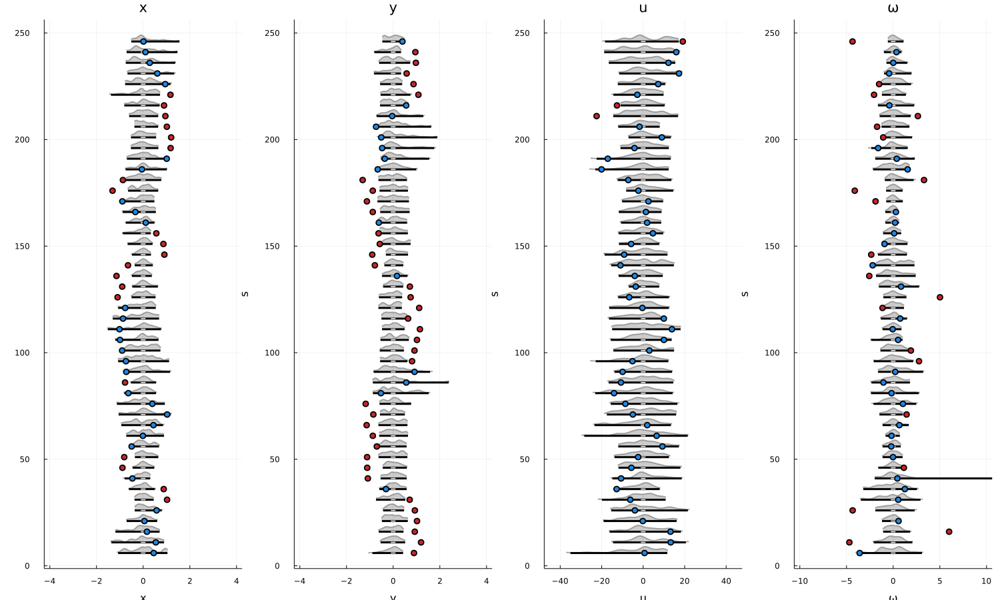

In [11]:
import MyterialColors: blue_dark, red_darker
plots = []


bws = Dict(
    :x => .1,
    :y => .1,
    :u => 2,
    :ω => .3,
)

xlims = Dict(
    :x => [-4, 4],
    :y => [-4, 4],
    :u => [-45, 45],
    :ω => [-10, 10],

)


plots = []


for var in vars
    plt = plot(; xlabel=var, ylabel="s", title=var, xlim=xlims[var])
    # plot!([0, 0], [0, 260], lw=4, ls=:dash, color="black", alpha=.3, label=nothing)

    # ms = var ∈ (:x, :y) ? 6 : 6 

    for i in 1:length(valid_points)
        # get data
        trials_data = filterdf(data, :class, :trials, :variable, var)
        model_data = filterdf(data, :class, :model, :variable, var)

        trials_data_cp = filterdf(trials_data, :cp_idx, i)[:, :value]
        model_data_cp = filterdf(model_data, :cp_idx, i)[:, :value][1]

        # get KDE params
        x0, x1 = percentile(trials_data_cp, 2), percentile(trials_data_cp, 98)
        bw = bws[var]
        xshift = median(trials_data_cp)
        spos = valid_points[i].s

        # plot kde
        kdeplot!(trials_data_cp; scaling=3.0, shift=spos,  v0=x0, v1=x1, bw=bw, xshift=xshift, color="black", nbins=100, label=nothing, normalize=true, alpha=.3, fillalpha=.2)
        
        # plot trials 95th CI + median
        plot!(
            [percentile(trials_data_cp, 2.5) - xshift, percentile(trials_data_cp, 97.5) - xshift],
            [spos, spos],
            color="black", label=nothing, lw=3
        )

        plot!(
            [0 - .025*xlims[var][1], 0 + .025*xlims[var][1]],
            [spos, spos],
            color="white", label=nothing, lw=1.5
        )


        # plot the model's value
        Δ = model_data_cp * .1
        marker_color = percentile(trials_data_cp, 2.5) ≤ model_data_cp ≤ percentile(trials_data_cp, 97.5) ? blue_dark : red_darker
        scatter!([model_data_cp - xshift], [spos], label=nothing, color=marker_color, ms=5)
        
    end
    push!(plots, plt)
end

plot(plots...; size=(1500, 900), layout=(1, 4))
